In [1]:
from ipy_oxdna.umbrella_sampling import MeltingUmbrellaSampling
from ipy_oxdna.oxdna_simulation import SimulationManager

import numpy as np
import pandas as pd
import os
from os.path import join
import matplotlib.pyplot as plt
import scienceplots
plt.style.use(['science', 'no-latex', 'bright'])

/home/alejandrosoto/.local/lib/python3.10/site-packages/matplotlib/projections/__init__.py:63: UserWarning: Unable to import Axes3D. This may be due to multiple versions of Matplotlib being installed (e.g. as a system package and as a pip package). As a result, the 3D projection is not available.
  warnings.warn("Unable to import Axes3D. This may be due to multiple versions of "
Warning on use of the timeseries module: If the inherent timescales of the system are long compared to those being analyzed, this statistical inefficiency may be an underestimate.  The estimate presumes the use of many statistically independent samples.  Tests should be performed to assess whether this condition is satisfied.   Be cautious in the interpretation of the data.

********* JAX NOT FOUND *********
 PyMBAR can run faster with JAX  
 But will work fine without it   
Either install with pip or conda:
      pip install pybar[jax]     
               OR                
      conda install pymbar       
**

#### Initalize parameters and the umbrella sampling object, creating the directories where the simulations will be stored

In [2]:
path = os.path.abspath('./')

file_dir_name = 'oxdna_files'  #'NAME_OF_DIR_CONTAINING_OXDNA_DAT_TOP'
file_dir = join(path, file_dir_name) #f'{path}/{file_dir_name}'

sim_dir_name = '8_nt_duplex_melting_tutorial' #'CHOSEN_NAME_WHERE_SIMULATION_WILL_BE_STORED'
sim_dir = join(file_dir, sim_dir_name)   #f'{path}/{sim_dir_name}'

# Initialize the umbrella sampling object, this will create the simulation directory

# Clean build has 3 options, False, True and 'force' False will not allow you to overwrite
# existing simulation directories, True will overwrite existing simulation directories after asking for confirmation
# 'force' will overwrite existing simulation directories without asking for confirmation
us = MeltingUmbrellaSampling(file_dir, sim_dir, clean_build=True)

# The simulation manager object is used to run the simulation is non-blocking subprocesses,
# and will optimally allocate the simulations to available resources
simulation_manager = SimulationManager()

# Indexes of nucleotides to apply forces to and measure distance between (Order Parameter(OP))
#com_list = '8,9,10,11,12,13,14,15'
#ref_list = '7,6,5,4,3,2,1,0'

com_list = '26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51'
ref_list = '25,24,23,22,21,20,19,18,17,16,15,14,13,12,11,10,9,8,7,6,5,4,3,2,1,0'

# Order of input nucleotides is import to collect the hb_contacts CV correctly, irrelevant for all else
com_list = ','.join(sorted(com_list.split(','), key=int)[::-1])
ref_list = ','.join(sorted(ref_list.split(','), key=int))

# Minimum and maximum distance between nucleotides the simulations will attempt to pull the OP 
xmin = 0
xmax = 51

# Number of simulation windows/replicas
n_windows = 200

# Stiffness of the COM harmonic bias potential
stiff = 3

# Temperature of the simulation
temperature = "60C"

# Starting_r0 is only relevant if you run the pre_equlibration step,
# needed if you have large stiffness values and range of the OP is large but dosen't hurt to always run quickly
# Not possible to know before you run the simulation but you can run a till they print once,
# terminate and paste the starting_r0 value from the output file
starting_r0 = 0.4213

# Frequecny of printing the CVs to file
print_every = 1e4

# Salt concentration
salt_concentration = 0.1

# Termostat
#thermostat = 'langevin'

#newtonian steps
#newtonian_steps = 108

#verlet_skin
verlet_skin = 0.3

#impplementations using CUDA

#backend_precision = 'mixed'
#CUDA_list = 0
#'CUDA_list': f'{CUDA_list}',

# Name of file to save all but one of the CVs to, it is possible this cannot be changed
obs_filename = 'all_observables.txt'

# Name of file to save the hb_contacts CV to
hb_contact_filename = 'hb_contacts.txt'

# Number of simulation steps to run for each window
pre_eq_steps = 1e6  # This only need to short
eq_steps = 7e6  # This needs to be long enough to equilibrate the system
prod_steps = 1e8 # This needs to be long enough to get converged free energy profiles (methods to check are provided)

# Setup the custom hb_contacts CV
particle_indexes = [com_list, ref_list]
hb_contact_observable = [{'idx':particle_indexes, 'name':f'{hb_contact_filename}', 'print_every':int(print_every)}]

# oxDNA Simulation parameters
pre_equlibration_parameters = {
    'backend':'CPU','backend_precesion':'double','salt_concentration':f'{salt_concentration}','verlet_skin':f'{verlet_skin}','steps':f'{pre_eq_steps}','print_energy_every': f'{pre_eq_steps // 10}',
    'print_conf_interval':f'{pre_eq_steps // 2}', 'use_edge': '1',
    'refresh_vel': '1','fix_diffusion': '0', 'T':f'{temperature}'}

equlibration_parameters = {
    'backend':'CPU','backend_precesion':'double','salt_concentration':f'{salt_concentration}','verlet_skin':f'{verlet_skin}','steps':f'{eq_steps}','print_energy_every': f'{eq_steps// 10}',
    'print_conf_interval':f'{eq_steps // 2}', 'use_edge': '1',
    'refresh_vel': '1', 'fix_diffusion': '0', 'T':f'{temperature}'}

production_parameters = {
    'backend':'CPU','backend_precesion':'double','salt_concentration':f'{salt_concentration}','verlet_skin':f'{verlet_skin}','steps':f'{prod_steps}','print_energy_every': f'{prod_steps}',
    'print_conf_interval':f'{prod_steps}', 'use_edge': '1',
    'refresh_vel': '1','fix_diffusion': '0', 'T':f'{temperature}'}


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


#### Build the pre-equlibration simulations, which will pull the windows to designated com distance

In [3]:
# This will build the pre_equlibration runs and queue them in the simulation manager

us.build_pre_equlibration_runs(
    simulation_manager, n_windows, com_list, ref_list, stiff, xmin, xmax,
    pre_equlibration_parameters, starting_r0, pre_eq_steps, continue_run=False,
    # If you want to continue a previous simulation set continue_run=int(n_steps)
    
    print_every=print_every, observable=True, protein=None, sequence_dependant=True,
    force_file=False, name=obs_filename, custom_observable=hb_contact_observable)

Are you sure you want to delete all simulation files? Type y/yes to continue or anything else to return use UmbrellaSampling(clean_build=str(force) to skip this message no


SystemExit: 
Continue a previous umbrella simulation using:
continue_run=int(n_steps)

/home/alejandrosoto/.local/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3585: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)


#### Run the simulations in non-blocking subprocesses while optimally allocating computational resources. It will only run as many simulations as you have avalible cpus minus one

In [4]:
simulation_manager.run(cpu_run=True) # This will run the simulation in the background (non-blocking)
#simulation_manager.worker_manager(cpu_run=True) # This will run the simulation in the foreground (blocking)

spawning
All queued simulations finished in: 0.0007648549508303404


#### Visualize simulation progress though com distance vs simulation step and number of hydrogen bonds vs simulations steps

,com_distance,hb_list,force_energy_0,force_energy_1,kinetic_energy,backbone,bonded_excluded_volume,stacking,nonbonded_excluded_volume,hydrogen_bonding,cross_stacking,coaxial_stacking,debye_huckel,steps,hb_contact
0,0.1434,26.0,0.002227,0.002227,0.345820,0.011449,0.0,-1.051915,0.0,-0.455232,-0.172689,0.0,0.061308,0,0.999999
1,0.2011,24.0,0.001377,0.001377,0.289900,0.045948,0.0,-1.121940,0.0,-0.336750,-0.124280,0.0,0.057433,10000,0.999999
2,0.1509,26.0,0.002058,0.002058,0.288683,0.046654,0.0,-1.106276,0.0,-0.333721,-0.123360,0.0,0.059086,20000,0.999998
3,0.2338,26.0,0.000961,0.000961,0.312120,0.044782,0.0,-1.104325,0.0,-0.325208,-0.116452,0.0,0.056972,30000,0.999998
4,0.1768,26.0,0.001631,0.001631,0.315716,0.039484,0.0,-1.094337,0.0,-0.321932,-0.105452,0.0,0.057489,40000,0.999997


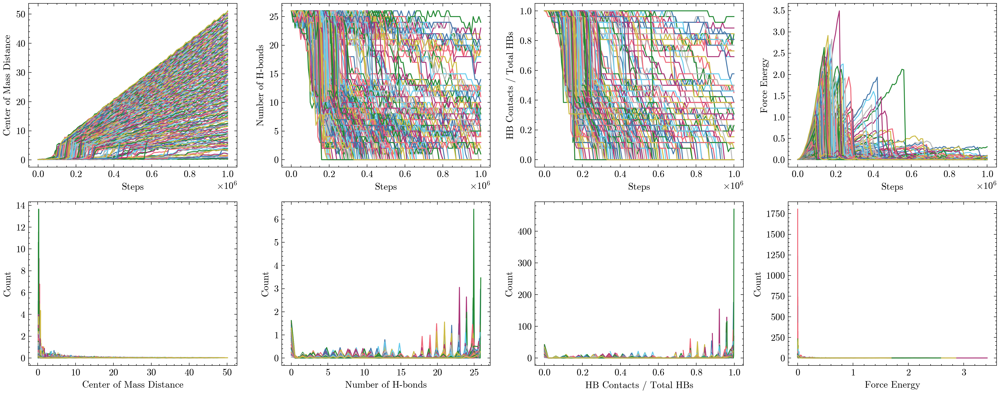

In [5]:
# Read collected variable into us.obs_df a list of n_windows dataframes
# The number of datapoints can vary between windows during run time, disallowing arrays
us.observables_list = []
us.initialize_observables(com_list, ref_list, print_every=print_every, name=obs_filename)

sim_type = 'pre_eq' # 'pre_eq', 'eq', 'prod'
us.analysis.read_all_observables(sim_type) 

us.analysis.plot_melting_CVs(rolling_window=1)
display(us.obs_df[0].head())

#### Open oxview interface with last saved conf and print energy

/home/alejandrosoto/Documents/oxDNA_python/ipy_oxDNA/examples/tutorials/linkerl1_26bp_different_c1/ipy_oxdna/oxdna_simulation.py:1728: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(self.sim_files.energy, delim_whitespace=True, names=['time', 'U', 'P', 'K'])
/home/alejandrosoto/Documents/oxDNA_python/ipy_oxDNA/examples/tutorials/linkerl1_26bp_different_c1/ipy_oxdna/oxdna_simulation.py:1728: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(self.sim_files.energy, delim_whitespace=True, names=['time', 'U', 'P', 'K'])
/home/alejandrosoto/Documents/oxDNA_python/ipy_oxDNA/examples/tutorials/linkerl1_26bp_different_c1/ipy_oxdna/oxdna_simulation.py:1728: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use

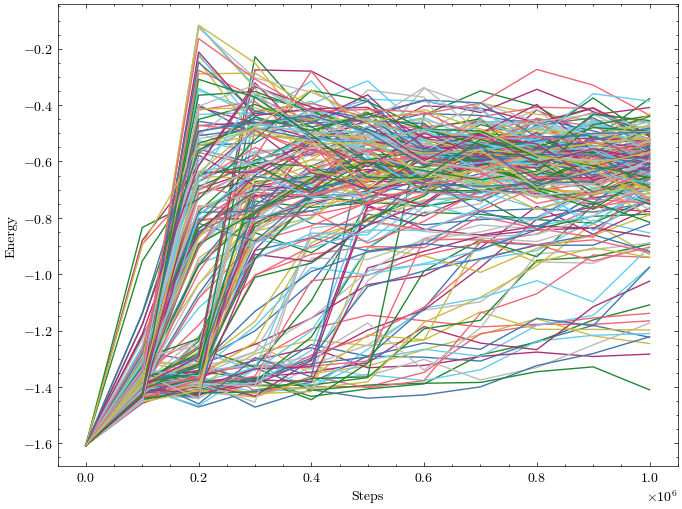

In [6]:
# This will provide access to the pre_equlibration simulations information
pre_eq_sims = us.pre_equlibration_sims
# us.equlibration_sims, us.production_sims are also available

# View conf interactivly in jupyter notebook
simulation_window_to_view = 7
pre_eq_sims[simulation_window_to_view].analysis.view_last() # .view_init(), .view_conf(conf_number), .get_conf_count()

# Plot the energy of the pre_equlibration simulations
fig, ax = plt.subplots(figsize=(8, 6))
for sim in pre_eq_sims:
    sim.analysis.plot_energy(fig=fig, ax=ax)
plt.legend()


#### Build equlibration run to bring strucutres to equlibrated state after pulling

In [7]:
us.build_equlibration_runs(
    simulation_manager, n_windows, com_list, ref_list,
    stiff, xmin, xmax, equlibration_parameters, continue_run=False,
    
    print_every=print_every, observable=True, protein=None, sequence_dependant=True,
    force_file=False, name=obs_filename, custom_observable=hb_contact_observable)

Are you sure you want to delete all simulation files? Type y/yes to continue or anything else to return use UmbrellaSampling(clean_build=str(force) to skip this message no


SystemExit: 
Continue a previous umbrella simulation using:
continue_run=int(n_steps)

/home/alejandrosoto/.local/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3585: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)


In [8]:
simulation_manager.run(cpu_run=True)

spawning


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


All queued simulations finished in: 0.0006706879939883947


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


#### Visualize equlibration simulation progress

/home/alejandrosoto/.local/lib/python3.10/site-packages/numpy/lib/histograms.py:885: RuntimeWarning: overflow encountered in divide
  return n/db/n.sum(), bin_edges
/home/alejandrosoto/.local/lib/python3.10/site-packages/numpy/lib/histograms.py:885: RuntimeWarning: overflow encountered in divide
  return n/db/n.sum(), bin_edges


,com_distance,hb_list,force_energy_0,force_energy_1,kinetic_energy,backbone,bonded_excluded_volume,stacking,nonbonded_excluded_volume,hydrogen_bonding,cross_stacking,coaxial_stacking,debye_huckel,steps,hb_contact
0,0.4210,19.0,0.000795,0.000795,0.296649,0.055376,0.000005,-0.988822,0.0,-0.255698,-0.091937,0.0,0.056980,0,0.809324
1,0.4558,21.0,0.001163,0.001163,0.339979,0.057917,0.000000,-0.998957,0.0,-0.262286,-0.087291,0.0,0.058377,10000,0.916674
2,0.4262,21.0,0.000845,0.000845,0.300381,0.048576,0.000000,-0.997125,0.0,-0.246702,-0.097365,0.0,0.059692,20000,0.884582
3,0.3473,22.0,0.000246,0.000246,0.348207,0.047030,0.000000,-1.009837,0.0,-0.261784,-0.105722,0.0,0.057560,30000,0.923073
4,0.4107,20.0,0.000699,0.000699,0.346762,0.034717,0.000000,-1.047310,0.0,-0.237241,-0.085967,0.0,0.063970,40000,0.884615


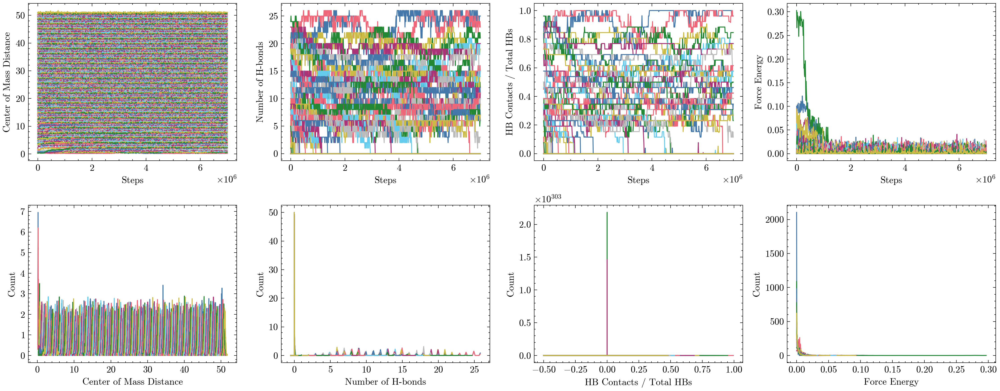

In [9]:
# Read collected variable into us.obs_df a list of n_windows dataframes
# The number of datapoints can vary between windows during run time, disallowing arrays
us.observables_list = []
us.initialize_observables(com_list, ref_list, print_every=print_every, name=obs_filename)

sim_type = 'eq' # 'pre_eq', 'eq', 'prod'
us.analysis.read_all_observables(sim_type) 

us.analysis.plot_melting_CVs(rolling_window=1)
display(us.obs_df[0].head())

#### Open oxview interface with last saved conf and print energy

/home/alejandrosoto/Documents/oxDNA_python/ipy_oxDNA/examples/tutorials/linkerl1_26bp_different_c1/ipy_oxdna/oxdna_simulation.py:1728: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(self.sim_files.energy, delim_whitespace=True, names=['time', 'U', 'P', 'K'])
/home/alejandrosoto/Documents/oxDNA_python/ipy_oxDNA/examples/tutorials/linkerl1_26bp_different_c1/ipy_oxdna/oxdna_simulation.py:1728: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(self.sim_files.energy, delim_whitespace=True, names=['time', 'U', 'P', 'K'])
/home/alejandrosoto/Documents/oxDNA_python/ipy_oxDNA/examples/tutorials/linkerl1_26bp_different_c1/ipy_oxdna/oxdna_simulation.py:1728: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use

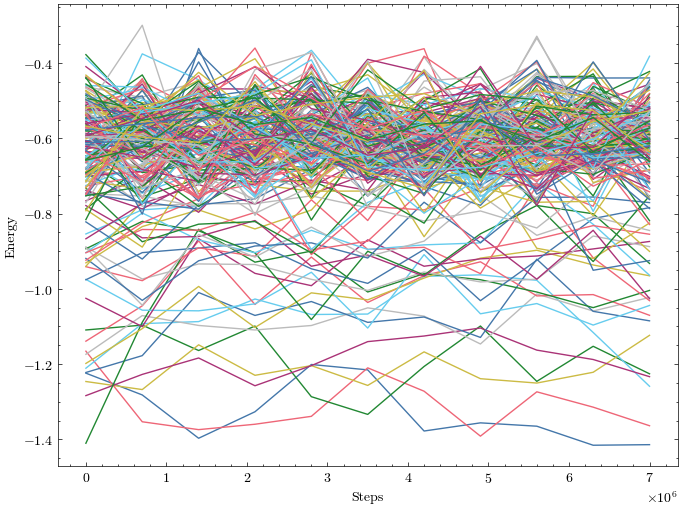

In [10]:
# This will provide access to the pre_equlibration simulations information
eq_sims = us.equlibration_sims
# us.equlibration_sims, us.production_sims are also available

# View conf interactivly in jupyter notebook
simulation_window_to_view = 7
eq_sims[simulation_window_to_view].analysis.view_last() # .view_init(), .view_conf(conf_number), .get_conf_count()

# Plot the energy of the pre_equlibration simulations
fig, ax = plt.subplots(figsize=(8, 6))
for sim in eq_sims:
    sim.analysis.plot_energy(fig=fig, ax=ax)
plt.legend()


#### Run the production simulations

In [12]:
us.build_production_runs(
    simulation_manager, n_windows, com_list, ref_list,
    stiff, xmin, xmax, production_parameters, continue_run=False,
    
    print_every=print_every, observable=True, protein=None, sequence_dependant=True,
    force_file=False, name=obs_filename, custom_observable=hb_contact_observable)

Are you sure you want to delete all simulation files? Type y/yes to continue or anything else to return use UmbrellaSampling(clean_build=str(force) to skip this message no


SystemExit: 
Continue a previous umbrella simulation using:
continue_run=int(n_steps)

/home/alejandrosoto/.local/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3585: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)


In [13]:
simulation_manager.run(cpu_run=True)

spawning


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


All queued simulations finished in: 0.0007894111331552267


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


In [35]:
#simulation_manager.terminate_all() # this method can be used to end all running simulations

#### Visualize production simulation progress

/home/alejandrosoto/.local/lib/python3.10/site-packages/numpy/lib/histograms.py:885: RuntimeWarning: overflow encountered in divide
  return n/db/n.sum(), bin_edges


,com_distance,hb_list,force_energy_0,force_energy_1,kinetic_energy,backbone,bonded_excluded_volume,stacking,nonbonded_excluded_volume,hydrogen_bonding,cross_stacking,coaxial_stacking,debye_huckel,steps,hb_contact
0,0.2139,25.0,0.000049,0.000049,0.336599,0.040878,0.0,-1.110209,0.0,-0.299752,-0.102944,0.0,0.057804,0,0.961535
1,0.2547,25.0,0.000000,0.000000,0.335064,0.041941,0.0,-1.103830,0.0,-0.320622,-0.115284,0.0,0.061812,10000,0.961536
2,0.2652,25.0,0.000003,0.000003,0.327100,0.042361,0.0,-1.075919,0.0,-0.319445,-0.127202,0.0,0.058679,20000,0.961536
3,0.2536,25.0,0.000000,0.000000,0.287512,0.034548,0.0,-1.081344,0.0,-0.321966,-0.111918,0.0,0.059333,30000,0.961536
4,0.2222,25.0,0.000031,0.000031,0.300224,0.049133,0.0,-1.093848,0.0,-0.313956,-0.111369,0.0,0.057487,40000,0.961521


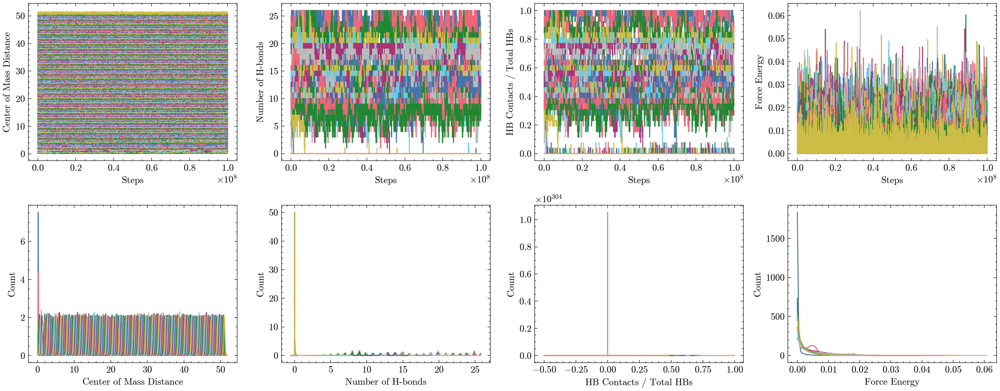

In [14]:
# Read collected variable into us.obs_df a list of n_windows dataframes
# The number of datapoints can vary between windows during run time, disallowing arrays
us.observables_list = []
us.initialize_observables(com_list, ref_list, print_every=print_every, name=obs_filename)

sim_type = 'prod' # 'pre_eq', 'eq', 'prod'
us.analysis.read_all_observables(sim_type) 

us.analysis.plot_melting_CVs(rolling_window=1)
display(us.obs_df[0].head())

/home/alejandrosoto/Documents/oxDNA_python/ipy_oxDNA/examples/tutorials/linkerl1_26bp_different_c1/ipy_oxdna/oxdna_simulation.py:1728: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(self.sim_files.energy, delim_whitespace=True, names=['time', 'U', 'P', 'K'])
/home/alejandrosoto/Documents/oxDNA_python/ipy_oxDNA/examples/tutorials/linkerl1_26bp_different_c1/ipy_oxdna/oxdna_simulation.py:1728: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(self.sim_files.energy, delim_whitespace=True, names=['time', 'U', 'P', 'K'])
/home/alejandrosoto/Documents/oxDNA_python/ipy_oxDNA/examples/tutorials/linkerl1_26bp_different_c1/ipy_oxdna/oxdna_simulation.py:1728: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use

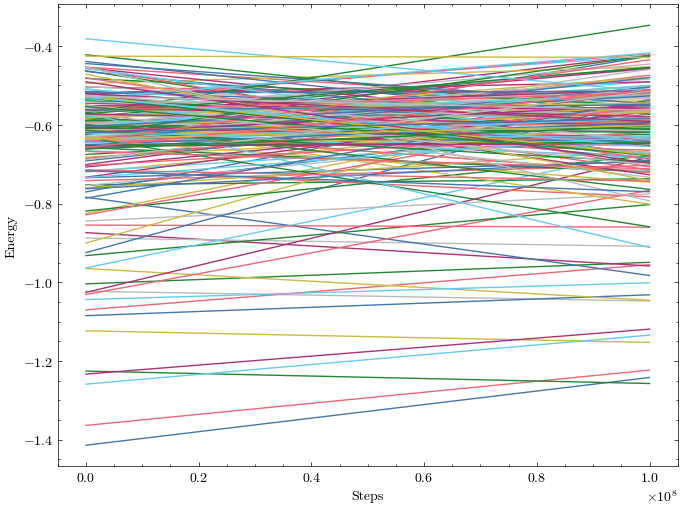

In [16]:
# This will provide access to the pre_equlibration simulations information
prod_sims = us.production_sims
# us.equlibration_sims, us.production_sims are also available

# View conf interactivly in jupyter notebook
prod_sims[0].analysis.view_last() # .view_init(), .view_conf(conf_number), .get_conf_count()

# Plot the energy of the pre_equlibration simulations
fig, ax = plt.subplots(figsize=(8, 6))
for sim in prod_sims:
    sim.analysis.plot_energy(fig=fig, ax=ax)
plt.legend()


#### Free energy profile as a function of the number of hydrogen bonds and com distance with temperature interpolation and convergence analysis for melting temperature calculation

In [17]:
# Only run this once you have production simulations running
#0.011%
temp_range = np.arange(40, 82, 2)
# temp_range = np.array([52])
n_bins = 100
xmin = 0 
xmax = 51
max_hb = 26
umbrella_stiff = 3
epsilon = 1e-5
convergence_slice = 2

us.discrete_and_continuous_converg_analysis(
    convergence_slice, temp_range,
    n_bins, xmin, xmax, umbrella_stiff, max_hb,
    epsilon=epsilon, reread_files=False)

WHAM | 59000/? [16:37<00:00, 59.14it/s, Convergence: 0.000010 / 1e-05]


Converged in [59139] iterations


WHAM | 56000/? [15:38<00:00, 59.67it/s, Convergence: 0.000010 / 1e-05]


Converged in [56523] iterations


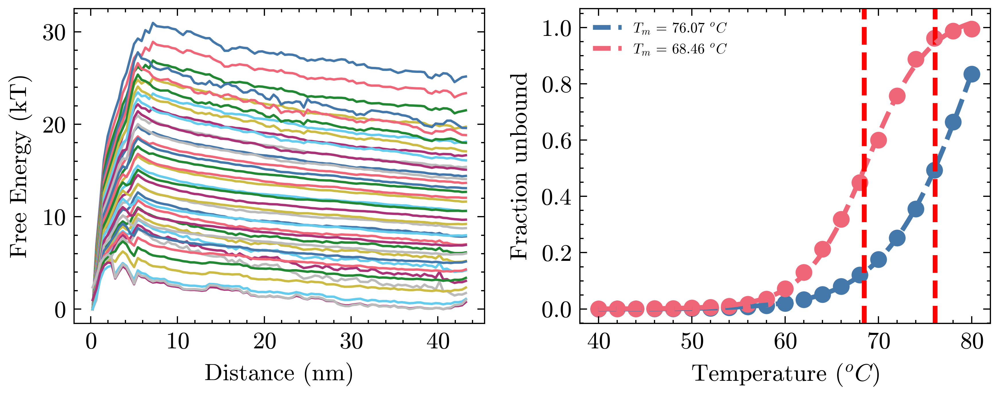

In [16]:
fig, (ax1, ax2) = plt.subplots(1,2, dpi=600, figsize=(6,2.5), tight_layout=True)

bin_centers, bin_edges = us.get_bins(xmin, xmax, n_bins=n_bins)
bin_centers = bin_centers*0.8518

for idx, free in enumerate(us.convergence_free):            
    sub_index = free[0].argmin()
    for f, temp_val in zip(free, temp_range):
        if idx == 0:
            ax1.plot(bin_centers, f, label=f'{temp_val}C WHAM Custom') 
        else:
            ax1.plot(bin_centers, f, label=f'{temp_val}C WHAM Custom')
ax1.set_xlabel('Distance (nm)')
ax1.set_ylabel('Free Energy (kT)')

for idx, (inverted_finfs, x_fit, y_fit, Tm) in enumerate(zip(us.convergence_inverted_finfs, us.convergence_x_fit, us.convergence_y_fit, us.convergence_Tm)):
    ax2.scatter(temp_range, inverted_finfs, marker='o')
    ax2.plot(x_fit, y_fit, linestyle='--', linewidth=2, label=f'$T_m$ = {Tm:.2f} $ ^o C$')
    ax2.axvline(x=Tm, color='r', linestyle='--', linewidth=2)#, label=f'Tm = {Tm:.2f} C')
    ax2.legend(fontsize=6)   
ax2.set_xlabel('Temperature ($ ^{o}C$)')
ax2.set_ylabel('Fraction unbound')
fig.tight_layout()

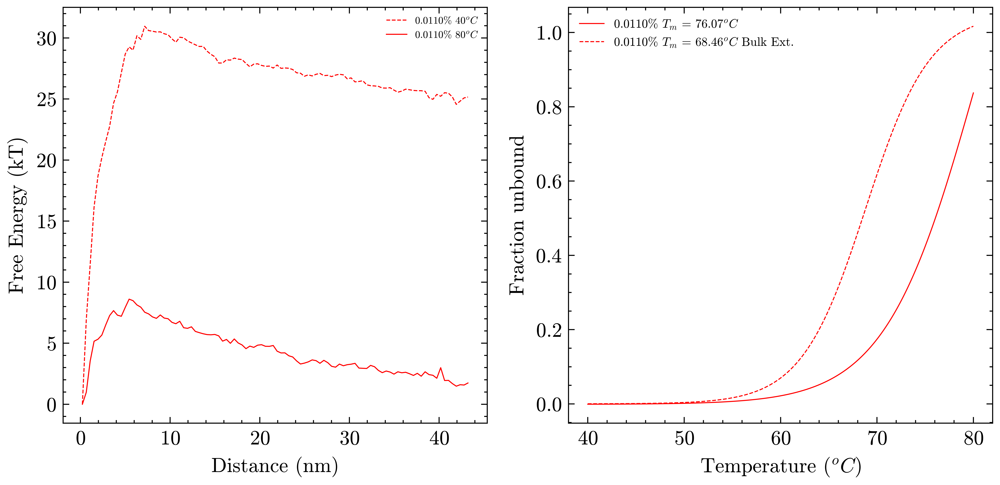

In [17]:
import pandas as pd

# Initialize lists to store x_fit and y_fit values
x_fit_values_1 = []
y_fit_values_1 = []
x_fit_values_2 = []
y_fit_values_2 = []
bin_centers_min = []
bin_centers_max = []
f_min = []
f_max = []

df_extreme_data_ref = pd.read_csv("./ref_all_steps/extreme_data_text_1.csv")
df_fit_data_ref = pd.read_csv("./ref_all_steps/fit_data.csv")

df_extreme_data_ref_1 = pd.read_csv("./ref_all_steps_1/extreme_data_text.csv")
df_fit_data_ref_1 = pd.read_csv("./ref_all_steps_1/fit_data.csv")

fig, (ax1, ax2) = plt.subplots(1,2, dpi=1200, figsize=(7,3.5), tight_layout=True)

bin_centers, bin_edges = us.get_bins(xmin, xmax, n_bins=n_bins)
bin_centers = bin_centers*0.8518


legend_added_min = False
legend_added_max = False

for idx, free in enumerate(us.convergence_free):            
    sub_index = free[0].argmin()
    for f, temp_val in zip(free, temp_range):
        if temp_val == min(temp_range) and not legend_added_min:
            ax1.plot(bin_centers, f, label="0.0110% "f'{temp_val}'"$ ^{o}C$", color='red', linestyle='--', linewidth=0.5)    
            bin_centers_min.extend(bin_centers)
            f_min.extend(f)
            legend_added_min = True
        elif temp_val == max(temp_range) and not legend_added_max:
            ax1.plot(bin_centers, f, label="0.0110% "f'{temp_val}'"$ ^{o}C$", color='red', linestyle='-', linewidth=0.5)
            bin_centers_max.extend(bin_centers)
            f_max.extend(f)
            legend_added_max = True

ax1.set_xlabel('Distance (nm)')
ax1.set_ylabel('Free Energy (kT)')
#ax1.plot(df_extreme_data_ref['bin_centers_min'],df_extreme_data_ref['f_min'],label="0.0058% 40$ ^{o}C$", color='black', linestyle='--', linewidth=0.5)
#ax1.plot(df_extreme_data_ref['bin_centers_max'],df_extreme_data_ref['f_max'],label="0.0058% 78$ ^{o}C$", color='black', linestyle='-', linewidth=0.5)
#ax1.plot(df_extreme_data_ref_1['bin_centers_min'],df_extreme_data_ref_1['f_min'],label="0.0010% 40$ ^{o}C$", color='blue', linestyle='--', linewidth=0.5)
#ax1.plot(df_extreme_data_ref_1['bin_centers_max'],df_extreme_data_ref_1['f_max'],label="0.0010% 78$ ^{o}C$", color='blue', linestyle='-', linewidth=0.5)
ax1.legend()
ax1.legend(fontsize=5)
fig.tight_layout()


extreme_data = {
    "bin_centers_min": bin_centers_min,
    "f_min": f_min,
    "bin_centers_max": bin_centers_max,
    "f_max": f_max,
}

df_ext = pd.DataFrame(extreme_data)
df_ext.to_csv("extreme_data_text_82.csv", index=False)

for idx, (inverted_finfs, x_fit, y_fit, Tm) in enumerate(zip(us.convergence_inverted_finfs, us.convergence_x_fit, us.convergence_y_fit, us.convergence_Tm)):
    
    if idx % 2 == 0:  # Usar módulo para alternar entre conjuntos de datos
        x_fit_values_1.extend(x_fit)
        y_fit_values_1.extend(y_fit)
        line_style = '-'  # Línea sólida
        label="0.0110% $T_{m}$ ="f' {Tm:.2f}'"$ ^{o}C$"
        
    else:
        x_fit_values_2.extend(x_fit)
        y_fit_values_2.extend(y_fit)
        line_style = '--'  # Línea segmentada
        label="0.0110% $T_{m}$ ="f' {Tm:.2f}'"$ ^{o}C$ Bulk Ext."
    
    ax2.plot(x_fit, y_fit, color = 'red', linestyle=line_style, linewidth=0.5, label=label)
#ax2.plot(df_fit_data_ref['x_fit_1'],df_fit_data_ref['y_fit_1'],linestyle = '-',color ='black', linewidth=0.5, label = "0.0058% $T_{m}=69.85 ^{o}C$")
#ax2.plot(df_fit_data_ref['x_fit_2'],df_fit_data_ref['y_fit_2'],linestyle = '--',color ='black', linewidth=0.5, label = "0.0058% $T_{m}=65.43 ^{o}C$ Bulk Ext.") 
#ax2.plot(df_fit_data_ref_1['x_fit_1'],df_fit_data_ref_1['y_fit_1'],linestyle = '-',color ='blue', linewidth=0.5, label = "0.0010% $T_{m}=61.86 ^{o}C$")
#ax2.plot(df_fit_data_ref_1['x_fit_2'],df_fit_data_ref_1['y_fit_2'],linestyle = '--',color ='blue', linewidth=0.5, label = "0.0010% $T_{m}=61.78 ^{o}C$ Bulk Ext.") 
ax2.legend(fontsize=6)  # Mueve la leyenda fuera del bucle
ax2.set_xlabel('Temperature ($ ^{o}C$)')
ax2.set_ylabel('Fraction unbound')
fig.tight_layout()


# Create a DataFrame with x_fit and y_fit values
fit_data = {
    "x_fit_1": x_fit_values_1,
    "y_fit_1": y_fit_values_1,
    "x_fit_2": x_fit_values_2,
    "y_fit_2": y_fit_values_2
}
df_fit = pd.DataFrame(fit_data)

# Export the DataFrame to a CSV file
df_fit.to_csv("fit_data_82.csv", index=False)

plt.savefig('comparison_plot_82.png', dpi=1000)


In [18]:
print(f'{Tm}')

68.45691382765531


In [19]:
pwd

'/home/alejandrosoto/Documents/oxDNA_python/ipy_oxDNA/examples/tutorials/linkerl1_26bp_different_c1'

#### Plot free energy profiles and melting curve

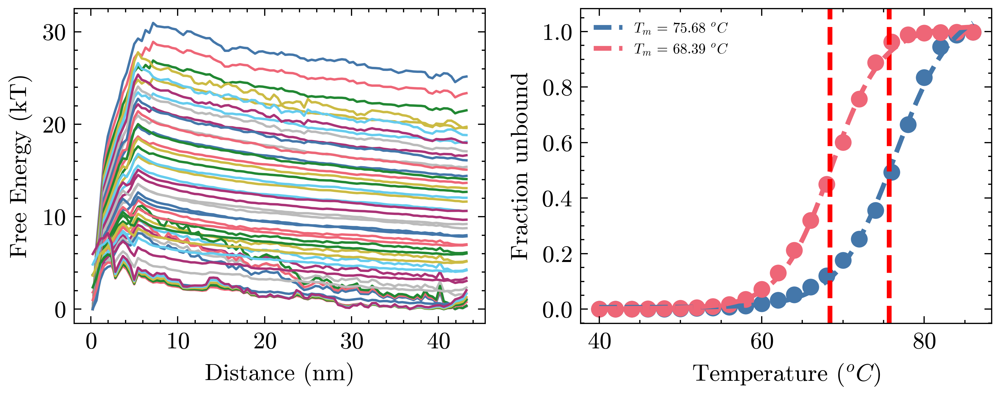

In [16]:
fig, (ax1, ax2) = plt.subplots(1,2, dpi=600, figsize=(6,2.5), tight_layout=True)

bin_centers, bin_edges = us.get_bins(xmin, xmax, n_bins=n_bins)
bin_centers = bin_centers*0.8518

for idx, free in enumerate(us.convergence_free):            
    sub_index = free[0].argmin()
    for f, temp_val in zip(free, temp_range):
        if idx == 0:
            ax1.plot(bin_centers, f, label=f'{temp_val}C WHAM Custom') 
        else:
            ax1.plot(bin_centers, f, label=f'{temp_val}C WHAM Custom')
ax1.set_xlabel('Distance (nm)')
ax1.set_ylabel('Free Energy (kT)')

for idx, (inverted_finfs, x_fit, y_fit, Tm) in enumerate(zip(us.convergence_inverted_finfs, us.convergence_x_fit, us.convergence_y_fit, us.convergence_Tm)):
    ax2.scatter(temp_range, inverted_finfs, marker='o')
    ax2.plot(x_fit, y_fit, linestyle='--', linewidth=2, label=f'$T_m$ = {Tm:.2f} $ ^o C$')
    ax2.axvline(x=Tm, color='r', linestyle='--', linewidth=2)#, label=f'Tm = {Tm:.2f} C')
    ax2.legend(fontsize=6)   
ax2.set_xlabel('Temperature ($ ^{o}C$)')
ax2.set_ylabel('Fraction unbound')
fig.tight_layout()

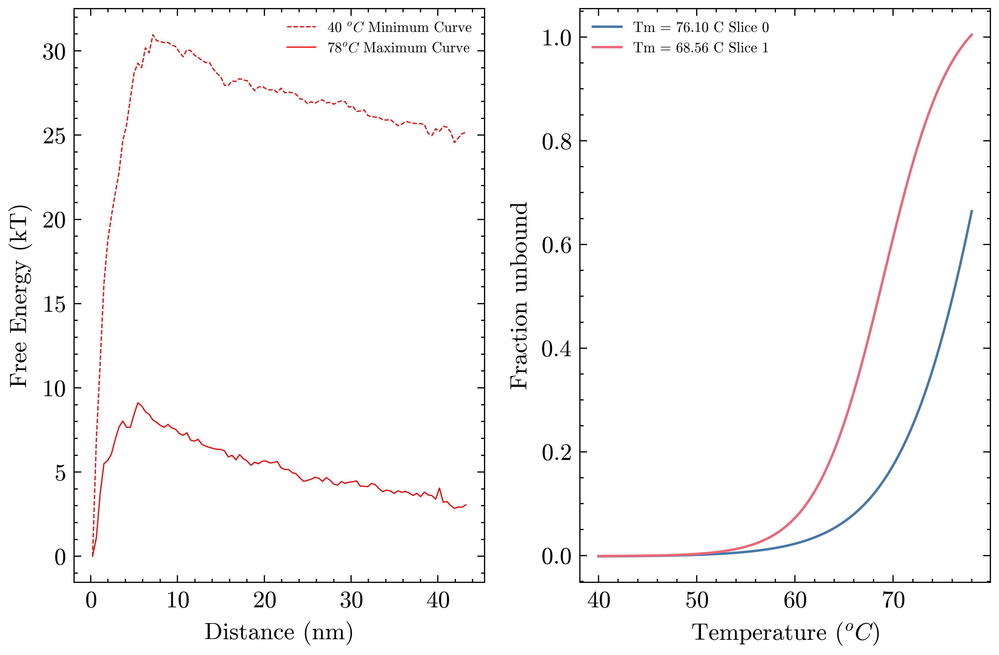

In [22]:
import pandas as pd

# Initialize lists to store x_fit and y_fit values
x_fit_values_1 = []
y_fit_values_1 = []
x_fit_values_2 = []
y_fit_values_2 = []
bin_centers_min = []
bin_centers_max = []
f_min = []
f_max = []


fig, (ax1, ax2) = plt.subplots(1,2, dpi=600, figsize=(6,4), tight_layout=True)

bin_centers, bin_edges = us.get_bins(xmin, xmax, n_bins=n_bins)
bin_centers = bin_centers*0.8518


legend_added_min = False
legend_added_max = False

for idx, free in enumerate(us.convergence_free):            
    sub_index = free[0].argmin()
    for f, temp_val in zip(free, temp_range):
        if temp_val == min(temp_range) and not legend_added_min:
            ax1.plot(bin_centers, f, label=f'{temp_val}'" $ ^{o}C$ Minimum Curve", color='red', linestyle='--', linewidth=0.5)    
            bin_centers_min.extend(bin_centers)
            f_min.extend(f)
            legend_added_min = True
        elif temp_val == max(temp_range) and not legend_added_max:
            ax1.plot(bin_centers, f, label=f'{temp_val}'"$ ^{o}C$ Maximum Curve", color='red', linestyle='-', linewidth=0.5)
            bin_centers_max.extend(bin_centers)
            f_max.extend(f)
            legend_added_max = True

ax1.set_xlabel('Distance (nm)')
ax1.set_ylabel('Free Energy (kT)')
ax1.legend()
ax1.legend(fontsize=6)
fig.tight_layout()


extreme_data = {
    "bin_centers_min": bin_centers_min,
    "f_min": f_min,
    "bin_centers_max": bin_centers_max,
    "f_max": f_max,
}

df_ext = pd.DataFrame(extreme_data)
df_ext.to_csv("extreme_data_text_1.csv", index=False)

for idx, (inverted_finfs, x_fit, y_fit, Tm) in enumerate(zip(us.convergence_inverted_finfs, us.convergence_x_fit, us.convergence_y_fit, us.convergence_Tm)):
    if idx % 2 == 0:  # Usar módulo para alternar entre conjuntos de datos
        x_fit_values_1.extend(x_fit)
        y_fit_values_1.extend(y_fit)
    else:
        x_fit_values_2.extend(x_fit)
        y_fit_values_2.extend(y_fit)
        
    #ax2.scatter(temp_range, inverted_finfs, marker='o')
    ax2.plot(x_fit, y_fit, linestyle='-', linewidth=1, label=f'Tm = {Tm:.2f} C Slice {idx}')
    #ax2.axvline(x=Tm, color='r', linestyle='--', linewidth=2)
    ax2.legend(fontsize=6)   
ax2.set_xlabel('Temperature ($ ^{o}C$)')
ax2.set_ylabel('Fraction unbound')
fig.tight_layout()

# Create a DataFrame with x_fit and y_fit values
fit_data = {
    "x_fit_1": x_fit_values_1,
    "y_fit_1": y_fit_values_1,
    "x_fit_2": x_fit_values_2,
    "y_fit_2": y_fit_values_2
}
df_fit = pd.DataFrame(fit_data)

# Export the DataFrame to a CSV file
df_fit.to_csv("fit_data.csv", index=False)

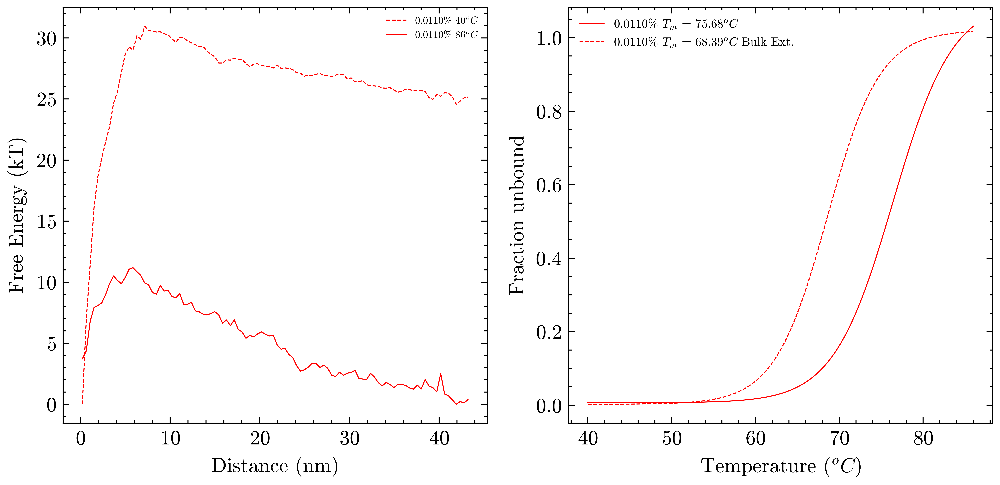

In [18]:
import pandas as pd

# Initialize lists to store x_fit and y_fit values
x_fit_values_1 = []
y_fit_values_1 = []
x_fit_values_2 = []
y_fit_values_2 = []
bin_centers_min = []
bin_centers_max = []
f_min = []
f_max = []

df_extreme_data_ref = pd.read_csv("./ref_all_steps/extreme_data_text_1.csv")
df_fit_data_ref = pd.read_csv("./ref_all_steps/fit_data.csv")

df_extreme_data_ref_1 = pd.read_csv("./ref_all_steps_1/extreme_data_text.csv")
df_fit_data_ref_1 = pd.read_csv("./ref_all_steps_1/fit_data.csv")

fig, (ax1, ax2) = plt.subplots(1,2, dpi=1200, figsize=(7,3.5), tight_layout=True)

bin_centers, bin_edges = us.get_bins(xmin, xmax, n_bins=n_bins)
bin_centers = bin_centers*0.8518


legend_added_min = False
legend_added_max = False

for idx, free in enumerate(us.convergence_free):            
    sub_index = free[0].argmin()
    for f, temp_val in zip(free, temp_range):
        if temp_val == min(temp_range) and not legend_added_min:
            ax1.plot(bin_centers, f, label="0.0110% "f'{temp_val}'"$ ^{o}C$", color='red', linestyle='--', linewidth=0.5)    
            bin_centers_min.extend(bin_centers)
            f_min.extend(f)
            legend_added_min = True
        elif temp_val == max(temp_range) and not legend_added_max:
            ax1.plot(bin_centers, f, label="0.0110% "f'{temp_val}'"$ ^{o}C$", color='red', linestyle='-', linewidth=0.5)
            bin_centers_max.extend(bin_centers)
            f_max.extend(f)
            legend_added_max = True

ax1.set_xlabel('Distance (nm)')
ax1.set_ylabel('Free Energy (kT)')
#ax1.plot(df_extreme_data_ref['bin_centers_min'],df_extreme_data_ref['f_min'],label="0.0058% 40$ ^{o}C$", color='black', linestyle='--', linewidth=0.5)
#ax1.plot(df_extreme_data_ref['bin_centers_max'],df_extreme_data_ref['f_max'],label="0.0058% 78$ ^{o}C$", color='black', linestyle='-', linewidth=0.5)
#ax1.plot(df_extreme_data_ref_1['bin_centers_min'],df_extreme_data_ref_1['f_min'],label="0.0010% 40$ ^{o}C$", color='blue', linestyle='--', linewidth=0.5)
#ax1.plot(df_extreme_data_ref_1['bin_centers_max'],df_extreme_data_ref_1['f_max'],label="0.0010% 78$ ^{o}C$", color='blue', linestyle='-', linewidth=0.5)
ax1.legend()
ax1.legend(fontsize=5)
fig.tight_layout()


extreme_data = {
    "bin_centers_min": bin_centers_min,
    "f_min": f_min,
    "bin_centers_max": bin_centers_max,
    "f_max": f_max,
}

df_ext = pd.DataFrame(extreme_data)
df_ext.to_csv("extreme_data_text.csv", index=False)

for idx, (inverted_finfs, x_fit, y_fit, Tm) in enumerate(zip(us.convergence_inverted_finfs, us.convergence_x_fit, us.convergence_y_fit, us.convergence_Tm)):
    
    if idx % 2 == 0:  # Usar módulo para alternar entre conjuntos de datos
        x_fit_values_1.extend(x_fit)
        y_fit_values_1.extend(y_fit)
        line_style = '-'  # Línea sólida
        label="0.0110% $T_{m}$ ="f' {Tm:.2f}'"$ ^{o}C$"
        
    else:
        x_fit_values_2.extend(x_fit)
        y_fit_values_2.extend(y_fit)
        line_style = '--'  # Línea segmentada
        label="0.0110% $T_{m}$ ="f' {Tm:.2f}'"$ ^{o}C$ Bulk Ext."
    
    ax2.plot(x_fit, y_fit, color = 'red', linestyle=line_style, linewidth=0.5, label=label)
#ax2.plot(df_fit_data_ref['x_fit_1'],df_fit_data_ref['y_fit_1'],linestyle = '-',color ='black', linewidth=0.5, label = "0.0058% $T_{m}=69.85 ^{o}C$")
#ax2.plot(df_fit_data_ref['x_fit_2'],df_fit_data_ref['y_fit_2'],linestyle = '--',color ='black', linewidth=0.5, label = "0.0058% $T_{m}=65.43 ^{o}C$ Bulk Ext.") 
#ax2.plot(df_fit_data_ref_1['x_fit_1'],df_fit_data_ref_1['y_fit_1'],linestyle = '-',color ='blue', linewidth=0.5, label = "0.0010% $T_{m}=61.86 ^{o}C$")
#ax2.plot(df_fit_data_ref_1['x_fit_2'],df_fit_data_ref_1['y_fit_2'],linestyle = '--',color ='blue', linewidth=0.5, label = "0.0010% $T_{m}=61.78 ^{o}C$ Bulk Ext.") 
ax2.legend(fontsize=6)  # Mueve la leyenda fuera del bucle
ax2.set_xlabel('Temperature ($ ^{o}C$)')
ax2.set_ylabel('Fraction unbound')
fig.tight_layout()


# Create a DataFrame with x_fit and y_fit values
fit_data = {
    "x_fit_1": x_fit_values_1,
    "y_fit_1": y_fit_values_1,
    "x_fit_2": x_fit_values_2,
    "y_fit_2": y_fit_values_2
}
df_fit = pd.DataFrame(fit_data)

# Export the DataFrame to a CSV file
df_fit.to_csv("fit_data.csv", index=False)

plt.savefig('comparison_plot.png', dpi=1000)


In [46]:
print(us.convergence_inverted_finfs)


[array([9.29510479e-06, 1.26518746e-05, 1.80351185e-05, 2.72346311e-05,
       4.56541120e-05, 9.17436286e-05, 2.22794833e-04, 6.04378482e-04,
       1.75579354e-03, 5.14817480e-03, 1.34755085e-02, 3.19316206e-02,
       7.05845108e-02, 1.46295069e-01, 2.81791317e-01, 4.94283167e-01,
       7.50041899e-01, 9.29662133e-01, 9.88806978e-01, 9.98670690e-01]), array([2.91201967e-05, 4.64868838e-05, 8.94263278e-05, 1.90458177e-04,
       4.29312096e-04, 1.02295756e-03, 2.52058434e-03, 5.99651231e-03,
       1.35471733e-02, 3.14374327e-02, 7.01938513e-02, 1.49207082e-01,
       3.03313381e-01, 5.62382470e-01, 8.35471458e-01, 9.58967791e-01,
       9.89110424e-01, 9.96454037e-01, 9.98626733e-01, 9.99387440e-01])]


In [47]:
print(temp_range)

[40 42 44 46 48 50 52 54 56 58 60 62 64 66 68 70 72 74 76 78]


In [48]:
print(inverted_finfs)

[2.91201967e-05 4.64868838e-05 8.94263278e-05 1.90458177e-04
 4.29312096e-04 1.02295756e-03 2.52058434e-03 5.99651231e-03
 1.35471733e-02 3.14374327e-02 7.01938513e-02 1.49207082e-01
 3.03313381e-01 5.62382470e-01 8.35471458e-01 9.58967791e-01
 9.89110424e-01 9.96454037e-01 9.98626733e-01 9.99387440e-01]


In [51]:
import pandas as pd

# Asegurarse de que los arrays tengan la misma longitud
assert len(temp_range) == len(us.convergence_inverted_finfs[0]) == len(us.convergence_inverted_finfs[1]), "Las longitudes de los arrays no coinciden"

# Crear el DataFrame
df = pd.DataFrame({
    'Temperature': temp_range,
    'Inverted Finfs 1': us.convergence_inverted_finfs[0],
    'Inverted Finfs 2': us.convergence_inverted_finfs[1]
})

# Guardar el DataFrame como un archivo CSV
df.to_csv('datos_experimentales_final.csv', index=False)


In [44]:
import os
import pandas as pd

# Obtener la ruta del directorio actual
current_directory = os.getcwd()

# Nombre del archivo CSV
csv_filename = 'datos_experimentales.csv'

# Ruta completa del archivo CSV
csv_path = os.path.join(current_directory, csv_filename)

# Crear listas para almacenar los datos
temperature_list = []
fraction_unbound_list = []

# Iterar sobre los datos de fracción desunida vs. temperatura y almacenarlos en las listas
for inverted_finfs, Tm in zip(us.convergence_inverted_finfs, us.convergence_Tm):
    for fraction_unbound in inverted_finfs:
        temperature_list.append(Tm)
        fraction_unbound_list.append(fraction_unbound)

# Crear un DataFrame con los datos
data = {
    'Temperature (°C)': temperature_list,
    'Fraction Unbound': fraction_unbound_list
    
}

df = pd.DataFrame(data)

# Guardar el DataFrame como un archivo CSV en la misma ubicación que el archivo de Python
df.to_csv(csv_path, index=False)

print(f'Archivo CSV guardado en: {csv_path}')


Archivo CSV guardado en: /home/alejandrosoto/Documents/oxDNA_python/ipy_oxDNA/examples/tutorials/linkerl1_26bp_melting_cpu_trial_backup_more_prod_port/datos_experimentales.csv


In [39]:
import pandas as pd

# Crear un DataFrame para almacenar los datos
data = {
    'Temperature (°C)': temp_range,
    'Fraction unbonded': us.convergence_inverted_finfs,
    'Inverted Finfs': us.convergence_inverted_finfs
}

# Convertir el diccionario en un DataFrame
df = pd.DataFrame(data)

# Guardar el DataFrame como un archivo CSV
csv_filename = 'datos_experimentales_1.csv'
df.to_csv(csv_filename, index=False)

print(f"Los datos se han guardado en el archivo CSV: {csv_filename}")


ValueError: All arrays must be of the same length

#### Multistate bennet acceptance ratio analysis for restrained umbrella sampling and temperature interpolation for arbitary collected variable free energy profile

In [ ]:
# You will need to reinitalize the observables if you did not build the dirs in your current kernel, I want to fix this
us.observables_list = []
us.initialize_observables(com_list, ref_list, print_every=print_every, name=obs_filename)


us.pymbar.run_mbar_fes(
    reread_files=True,
    sim_type='prod',
    restraints=False,
    force_energy_split=True)

max_hb = 8
temp_range = np.array([42, 52, 62])

free_n_hb, bin_n_hb, dfree_n_hb = us.pymbar.n_hb_fes_hist(max_hb, temp_range=temp_range)
free_i_com, bin_com, dfree_com = us.pymbar.com_fes_hist(n_bins=20, temp_range=temp_range)

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


In [21]:
plt.figure()
for idx, free in enumerate(free_n_hb):
    plt.plot(bin_n_hb, free, label=f'{temp_range[idx]}C')

plt.figure()
for idx, free in enumerate(free_i_com):
    plt.plot(bin_com, free, label=f'{temp_range[idx]}C')
plt.legend()

NameError: name 'free_n_hb' is not defined

<Figure size 350x262.5 with 0 Axes>